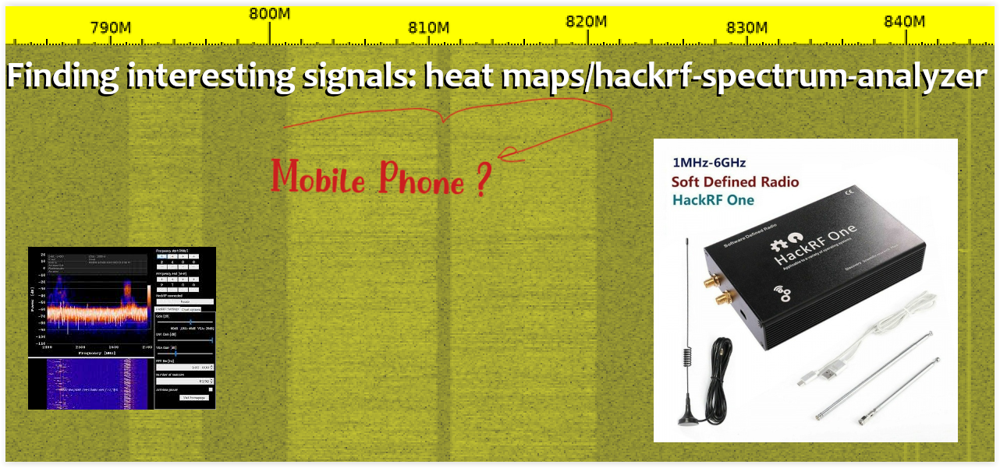

In [3]:
from IPython import display
display.Image("./banner_hack.PNG")

 hackrf_sweep. This new feature allows us to scan across the spectrum at up to 8 GHz per second, which means that a full 0 – 6 GHz scan can complete in under a second.
 https://hackrf.readthedocs.io/en/latest/hackrf_sweep.html

In [4]:
!hackrf_sweep --help


hackrf_sweep: invalid option -- -
Usage:
	[-h] # this help
	[-d serial_number] # Serial number of desired HackRF
	[-a amp_enable] # RX RF amplifier 1=Enable, 0=Disable
	[-f freq_min:freq_max] # minimum and maximum frequencies in MHz
	[-p antenna_enable] # Antenna port power, 1=Enable, 0=Disable
	[-l gain_db] # RX LNA (IF) gain, 0-40dB, 8dB steps
	[-g gain_db] # RX VGA (baseband) gain, 0-62dB, 2dB steps
	[-n num_samples] # Number of samples per frequency, 8192-4294967296
	[-w bin_width] # FFT bin width (frequency resolution) in Hz
	[-1] # one shot mode
	[-N num_sweeps] # Number of sweeps to perform
	[-B] # binary output
	[-I] # binary inverse FFT output
	-r filename # output file

Output fields:
	date, time, hz_low, hz_high, hz_bin_width, num_samples, dB, dB, . . .


run HackRF sweep and save csv file


**1mhz to 1000mhz (1Ghz)** [-N ] number of sweeps



In [ ]:
!hackrf_sweep -f 1:1000 -l 32 -g 32 -w 100000 -N 1000 > sweep6.csv

remmber to press (ctrl + c ) to end hackRF_sweep 

view CSV data captured

In [ ]:
import pandas as pd
data = pd.read_csv("sweep6.csv")
print("Row:Date  :   Time   : hz_low :hz_high:bin:samples:dB, dB, ...")
data.head()




plotsweep is a tool to plot spectrogram images from hackrf_sweep, soapy_power, or rtl_power output.
https://github.com/greatscottgadgets/plotsweep

In [ ]:
!plotsweep --help


In [ ]:
!plotsweep sweep6.csv ex6magma.png --power-min -60 --power-max -15.0 --colormap magma

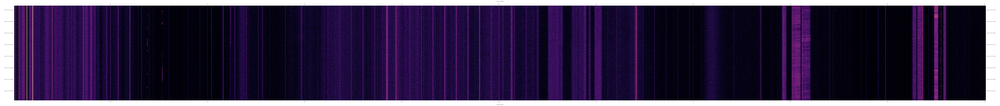

In [2]:
from IPython import display
display.Image("./ex6magma.png")

get Heatmap.py from here
https://github.com/keenerd/rtl-sdr-misc/tree/master/heatmap


I was getting errors with it using hackrf-sweep csv files "Heatmap.py IndexError on CSV input"   hence I started using plotsweep but this seems to fix the issuse I was having 
https://stackoverflow.com/questions/65421912/heatmap-py-indexerror-on-csv-input

You just need to set a lower minimum point using the --db argument, like so:

Since " then it drops to -136 or -145", run:

./heatmap.py --db -150 0 data.csv image.png

that will make sure it renders anything not below -150 too.


In [ ]:
!python heatmap.py --db -150 0 sweep6.csv sweep6.png

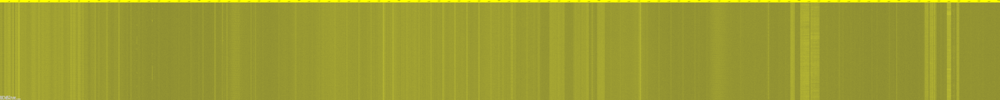

In [1]:
from IPython import display
display.Image("./sweep6.png")

# HackRF update firmware 

update hackrf firmware https://www.securesolutions.no/updating-the-hackrf-ones-firmware/ 
    Download your appropriate HackRF release: https://github.com/mossmann/hackrf/releases/
    Extract: tar -xfv hackrf-2017.02.1.tar.xz ***(I used the zip file) winrar to unzip***
    Open up the folder containing the firmware: cd hackrf-2017.02.1/firmware-bin/ 
    Update the SPI flash: hackrf_spiflash -w hackrf_one_usb.bin
    Update the CPLD: hackrf_cpldjtag -x hackrf_cpld_default.xsvf
    Press the reset button and let it boot. Verify firmware version: hackrf_info


# HackRF work on windows 

The Pothos SDR environment includes pre-compiled HackRF support for
windows, further info here: https://github.com/pothosware/PothosSDR/wiki

the latest version did not work for me did not seem to have the hackrf tools ...but an earlier version did PothosSDR-2020.12.28-vc14-x64.exe https://downloads.myriadrf.org/builds/PothosSDR/


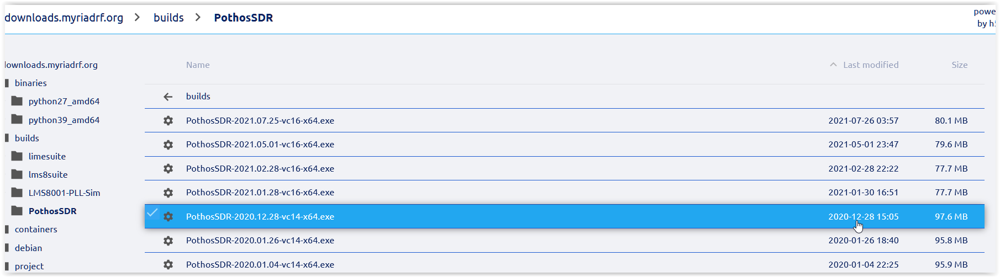

In [5]:
from IPython import display
display.Image("./pothosSDR.png")

you might have to update this ...in "options" tick "list all devices" then select "hackrf one" https://zadig.akeo.ie/

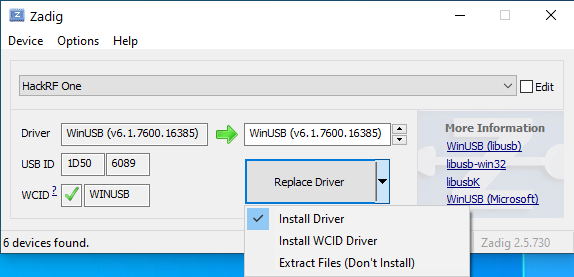

In [6]:
from IPython import display
display.Image("./zadig.png")

## Spectrum Analyzer GUI for hackrf_sweep for Windows/Linux 
https://github.com/pavsa/hackrf-spectrum-analyzer

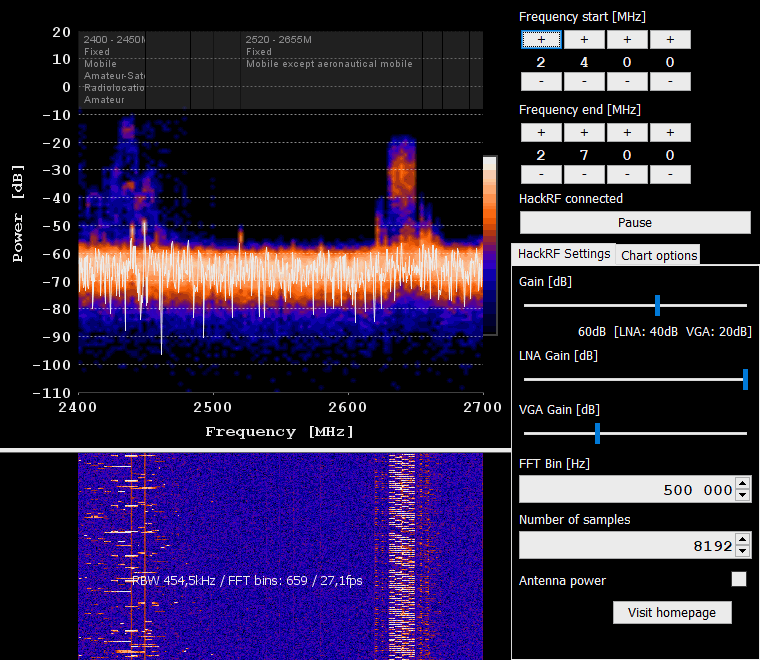

In [7]:
from IPython import display
display.Image("./spectrum.gif")